# Plotly and Datawrapper

In [1]:
# !pip install plotly

In [43]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

plt.style.use('ggplot')

### Plotly.express

Ссылка: https://plotly.com/python/plotly-express/

In [3]:
import plotly.express as px 

Самый простой способ нарисовать график при помощи plotly, это воспользоваться plotly.express. Для этого надо создать объект Figure, который на вход принимает информации о данных и о макете.

In [4]:
line = np.sin(2*np.pi*np.random.normal(0, 1, size=10))

fig = px.line(x=np.arange(10), y=line)
  
print(fig)

Figure({
    'data': [{'hovertemplate': 'x=%{x}<br>y=%{y}<extra></extra>',
              'legendgroup': '',
              'line': {'color': '#636efa', 'dash': 'solid'},
              'marker': {'symbol': 'circle'},
              'mode': 'lines',
              'name': '',
              'orientation': 'v',
              'showlegend': False,
              'type': 'scatter',
              'x': array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
              'xaxis': 'x',
              'y': array([-0.83541834, -0.99848086, -0.91261254, -0.94020054, -0.71617616,
                          -0.78332595,  0.59220945,  0.67697972,  0.00207542,  0.27150018]),
              'yaxis': 'y'}],
    'layout': {'legend': {'tracegroupgap': 0},
               'margin': {'t': 60},
               'template': '...',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0], 'title': {'text': 'x'}},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'y'}}}
})


Чтобы нарисовать график, необходимо воспользоваться методом show().

In [5]:
fig.show()

Нарисуем гистограмму и зададим базовые настройки графику.

In [6]:
line = np.sin(2*np.pi*np.random.normal(0, 1, size=1000))

# fig = px.histogram(line, nbins=40, title='Histogram example')
fig = px.histogram(line, nbins=40, title='Histogram example', histnorm='probability density', text_auto=True)

fig.update_layout(
    bargap=0.2,
    
    xaxis_title="Time",
    yaxis_title="Values",
    legend_title="Legend",
    
    font_family="Helvetica",
    font_color="black",
    title_font_family="Helvetica",
    title_font_color="blue",
    title_font_size=20,
    legend_title_font_color="green"
)

fig.show()

In [7]:
df = px.data.tips()

fig = px.histogram(df, x="sex", y="total_bill", color="sex", pattern_shape="smoker")

fig.show()

In [8]:
df = px.data.gapminder().query("year == 2007")

fig = px.treemap(df, path=[px.Constant('world'), 'continent', 'country'], values='pop',
                  color='lifeExp', hover_data=['iso_alpha'])

fig.show()

### Plotly.graph_objects

In [9]:
import plotly.graph_objects as go

In [10]:
fig = go.Figure(
    data=[go.Histogram(
        x=line, histnorm='probability'
    )]
)

fig.add_trace(go.Histogram(x=line+np.random.uniform(-1, 1, size=len(line)),\
                           histnorm='probability',  marker_color='#EB89B5', xbins=dict(
                                                            start=-5.0, end=2, size=0.1), nbinsx=30
                          ))

fig.update_layout(barmode='overlay')
fig.update_traces(opacity=0.8)

fig.update_layout(
    bargap=0.2,
    bargroupgap=0.6,
    
    xaxis_title="Time",
    yaxis_title="Values",
    title ="Several Histograms",
    legend_title="Legend",
    
    font_family="Helvetica",
    font_color="black",
    title_font_family="Helvetica",
    title_font_color="blue",
    title_font_size=20,
    legend_title_font_color="black"
)

fig.show()

Для отрисовки нескольких гистограмм на разных графиках, необходимо воспользоваться библиотекой plotly.subplots методом make_subplots.

In [11]:
from plotly.subplots import make_subplots

In [12]:
fig = make_subplots(rows=3, cols=2, subplot_titles=('Normal Distribution', 'Uniform Distribution',
                                                    'Exponential Distribution', 'Poisson Distribution',
                                                    'Laplace Distribution'),
                                   specs=[[{}, {}], [{}, {}], [{"colspan": 2}, None]])

hist1 = go.Histogram(x=np.random.normal(0, 1, size=1000), nbinsx=40, histnorm='probability')
hist2 = go.Histogram(x=np.random.uniform(-10, 10, size=10000), nbinsx=40, histnorm='probability')
hist3 = go.Histogram(x=np.random.exponential(5, size=1000), nbinsx=40, histnorm='probability')
hist4 = go.Histogram(x=np.random.poisson(1, size=1000), nbinsx=30, histnorm='probability')
hist5 = go.Histogram(x=np.random.laplace(2, size=1000), nbinsx=40, histnorm='probability')

fig.append_trace(hist1, 1, 1)
fig.append_trace(hist2, 1, 2)
fig.append_trace(hist3, 2, 1)
fig.append_trace(hist4, 2, 2)
fig.append_trace(hist5, 3, 1)

fig.update_layout(
    bargap=0.2,
    title='Histograms',
    legend_title='Legend',
    xaxis_title='x1',
    height=600, width=900,
    
)


fig.update_xaxes(title_text="X", row=1, col=1)
fig.update_xaxes(title_text="X", range=[-10, 10], row=1, col=2)
fig.update_xaxes(title_text="X", row=2, col=1)
fig.update_xaxes(title_text="X", row=2, col=2)
fig.update_xaxes(title_text="X", row=3, col=1)

fig.update_yaxes(title_text="Frequency", row=1, col=1)
fig.update_yaxes(title_text="Frequency", row=1, col=2)
fig.update_yaxes(title_text="Frequency", showgrid=False, row=2, col=1)
fig.update_yaxes(title_text="Frequency", row=2, col=2)
fig.update_yaxes(title_text="Frequency", row=3, col=1)

fig.show()

Чтобы сохранять графики, необходимо установить kaleido

In [13]:
# !pip install -U kaleido

In [14]:
fig.write_image('Several_Histograms.pdf', scale=3)

### Plotly.figure_factory

Другой спобособ рисовать графики с более гибкими настройками это figure_factory.

In [15]:
import plotly.figure_factory as ff

In [16]:
x1 = np.random.normal(-3, 1, size=1000)
x2 = np.random.normal(0, 1, size=1000)
x3 = np.random.normal(2, 1, size=1000)
x4 = np.random.normal(5, 1, size=1000)

# Group data together
hist_data = [x1, x2, x3, x4]

group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4']

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=[.1, .25, .5, 1])

fig.layout.title = 'Example of Histogram plot'

fig.show()

In [17]:
x1 = np.random.randn(2000) - 2
x2 = np.random.randn(2000)
x3 = np.random.randn(2000) + 2

hist_data = [x1, x2, x3]

group_labels = ['Group 1', 'Group 2', 'Group 3']
colors = ['#C12F2F', '#372B28', '#723A86']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot(hist_data, group_labels, colors=colors,
                         bin_size=.2, show_rug=False)


fig.update_layout(
    title="Several histograms",
    legend_title="Legend",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="RebeccaPurple"
    ))

fig.update_yaxes(title='Frequencies')
fig.update_xaxes(title='X')

fig.show()

In [18]:
# !pip install -U kaleido

In [19]:
import plotly.io as pio

pio.write_image(fig, 'image.pdf', scale=3, engine='kaleido')

In [20]:
fig.write_image('image2.pdf', scale=3)

# Dash
Ссылка: https://dash.gallery/Portal/?_gl=1*1i93h7z*_ga*MzI3NjM3MDQ5LjE2NzY2MzA4OTM.*_ga_6G7EE0JNSC*MTY3Nzc1NTk0NS4yLjAuMTY3Nzc1NTk0NS4wLjAuMA..

In [21]:
# !pip install dash

In [22]:
import dash
import dash_core_components as dcc
import dash_html_components as html

app = dash.Dash()
app.layout = html.Div([
    dcc.Graph(figure=fig)
])

app.run_server(debug=True, use_reloader=False)

Dash is running on http://127.0.0.1:8050/

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: on


<ipython-input-22-9976190b1610>:2: UserWarning:


The dash_core_components package is deprecated. Please replace
`import dash_core_components as dcc` with `from dash import dcc`

<ipython-input-22-9976190b1610>:3: UserWarning:


The dash_html_components package is deprecated. Please replace
`import dash_html_components as html` with `from dash import html`



In [27]:
from dash import Dash, dcc, html, Input, Output

app = Dash(__name__)


app.layout = html.Div([
    html.H4('Interactive Histogram of Normal Distribution'),
    dcc.Graph(id="graph"),
    html.P("Mean:"),
    dcc.Slider(id="mean", min=-5, max=5, value=0, 
               marks={-5: '-5', 5: '5'}),
    html.P("Standard Deviation:"),
    dcc.Slider(id="std", min=1, max=3, value=1, 
               marks={1: '1', 3: '3'}),
])

@app.callback(
    Output("graph", "figure"), 
    Input("mean", "value"), 
    Input("std", "value"))

def display_color(mean, std):
    data = np.random.normal(mean, std, size=1000) # replace with your own data source
    fig = px.histogram(data, range_x=[-10, 10], nbins=40,  histnorm='probability density')
    
    fig.update_layout(
    bargap=0.2,
    title='Histogram',
    legend_title='Legend',
    xaxis_title='X')
    
    return fig

app.run_server(debug=True, use_reloader=False)

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: on


# DataWrapper

In [ ]:
# !pip install datawrapper

In [28]:
from datawrapper import Datawrapper

In [29]:
dw = Datawrapper(access_token = "51IMuyaXrsZx32JvuVuIL3DGc0kCJfOVvaxB6PPhL2tcdRk1V3eVGf6oGBLf1Jqz")

In [30]:
dw.account_info()

{'id': 543410,
 'email': 'kirill.zakharovblack@gmail.com',
 'name': 'Kirill Zakharov',
 'role': 'editor',
 'language': 'en-US',
 'teams': [],
 'chartCount': 10,
 'url': '/v3/users/543410'}

In [31]:
df = pd.read_csv('gen.us.txt')

In [32]:
df = df.iloc[:100, 1:-2]

In [33]:
df

,Open,High,Low,Close
0,15.50,15.50,15.50,15.50
1,16.00,16.57,15.90,15.90
2,16.10,16.20,16.00,16.00
3,15.90,16.02,15.71,15.85
4,15.90,15.91,15.22,15.51
...,...,...,...,...
95,16.19,16.19,15.95,16.01
96,16.06,16.30,15.57,15.75
97,15.90,16.28,15.30,16.05
98,16.03,16.24,15.85,16.00


In [34]:
columns = ['Time','Open','High','Low','Close']

In [35]:
df.to_csv('Example_data.csv', header=None)

In [36]:
dot_plot = dw.create_chart(chart_type='d3-lines', title='Scatter plot',\
                           data = df)

New chart d3-lines created!


In [37]:
dw.publish_chart(chart_id = dot_plot['id'])

/opt/anaconda3/lib/python3.8/site-packages/IPython/core/display.py:717: UserWarning:

Consider using IPython.display.IFrame instead



# Running time comparison

In [40]:
import time

In [63]:
st = time.time()

N = 100000

# Create figure
fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x = np.random.randn(N),
        y = np.random.randn(N),
        mode = 'markers',
        marker = dict(
            line = dict(
                width = 1,
                color = 'DarkSlateGrey')
        )
    )
)

fig.show()

et = time.time()

In [64]:
plotly_stand = et-st
plotly_stand

0.7193269729614258

In [82]:
st = time.time()

N = 100000

# Create figure
fig = go.Figure()

fig.add_trace(
    go.Scattergl(
        x = np.random.randn(N),
        y = np.random.randn(N),
        mode = 'markers',
        marker = dict(
            line = dict(
                width = 1,
                color = 'black')
        )
    )
)

fig.show()

et = time.time()

In [83]:
plotly_webgl = et-st
plotly_webgl

0.011462926864624023

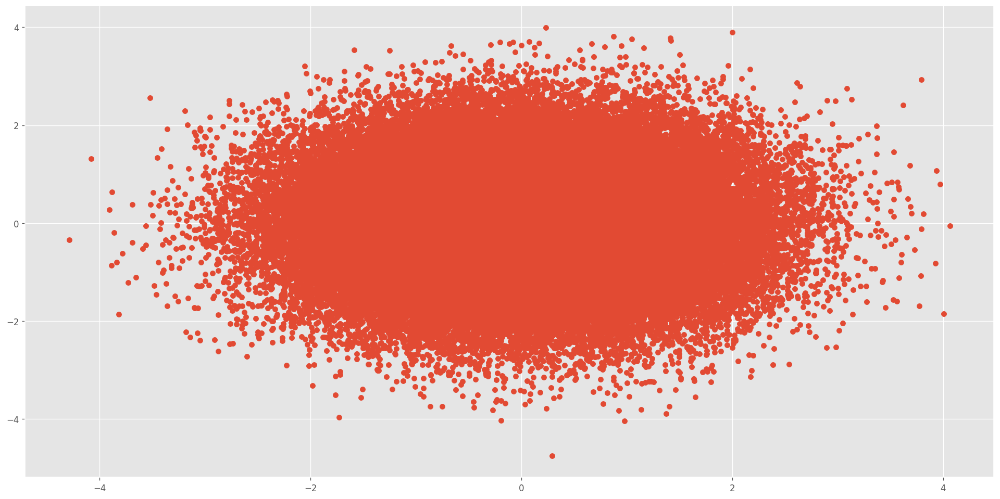

In [81]:
st = time.time()

plt.subplots(figsize=(20, 10), dpi=120)
x = np.random.randn(N)
y = np.random.randn(N)

plt.scatter(x, y)
plt.show()

et = time.time()

In [70]:
matplot = et-st
matplot

0.35742688179016113

In [77]:
pd.DataFrame(np.array([plotly_stand, plotly_webgl, matplot]).reshape(1, -1), index=['Time'],\
             columns=['Plotly', 'Plotly WebGL', 'Matplotlib'])

,Plotly,Plotly WebGL,Matplotlib
Time,0.719327,0.691442,0.357427
